In [ ]:
#Data downloaded from https://janelia.figshare.com/articles/Functional_imaging_data_for_ablation_experiments_in_the_zebrafish_embryonic_spinal_cord/7607411

In [1]:
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt

In [2]:
double_fish_before=loadmat('C:/Users/koester_lab/Documents/Maria/Neural-Data-Analysis/ZebraFish/DevelopmentKeller/AblationData/double_fish_1_before/profile.mat')

In [6]:
print(double_fish_before['profile_all'].shape)

(362, 1226)


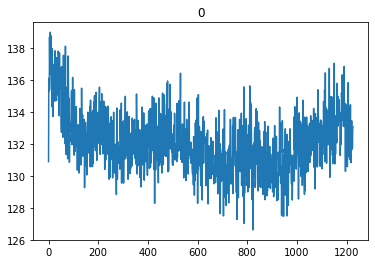

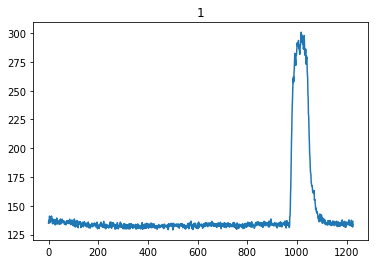

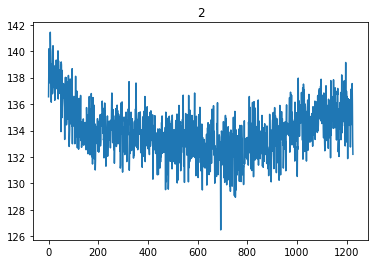

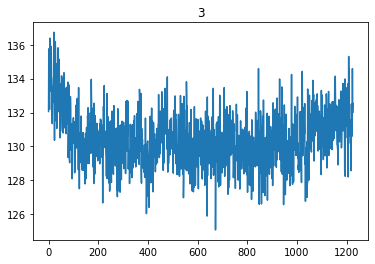

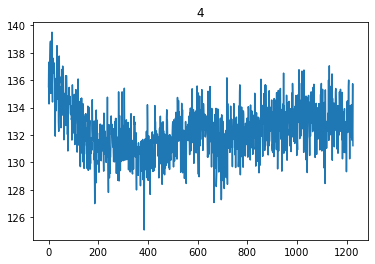

...

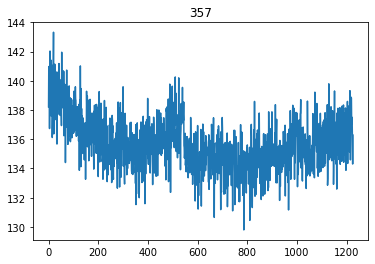

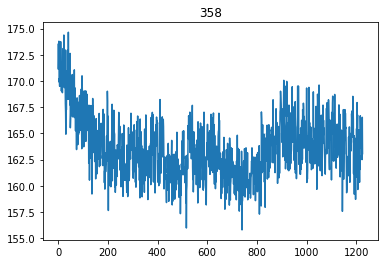

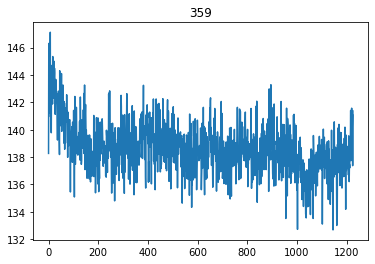

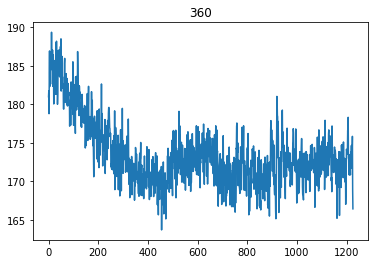

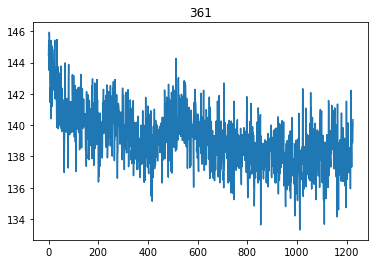

In [7]:
for cell in range(0,362):
    plt.plot(double_fish_before['profile_all'][cell,:])
    plt.title(str(cell))
    plt.show()

In [13]:
def window(data):
    window=np.array([[1,2,3],[4,5,6]])
    print(data.shape)
    print(window.shape)
    print(data[window])
    
window(double_fish_before['profile_all'][0,:])

(1226,)
(2, 3)
[[136.12244898 135.73469388 135.32653061]
 [138.71428571 136.7755102  137.97959184]]


In [98]:
def extract_windows_vectorized(array, max_time, sub_window_size):
    start = 0 
    sub_windows = (
        start +
        # expand_dims are used to convert a 1D array to 2D array.
        np.expand_dims(np.arange(sub_window_size), 0) +
        np.expand_dims(np.arange(max_time + 1), 0).T
    )
    print(sub_windows)
    print(array.shape)
    print(sub_windows.shape)
    array=np.pad(array,(sub_window_size,sub_window_size),'constant',constant_values=(0,0))
    print(array.shape)
    return array[sub_windows]

array=extract_windows_vectorized(double_fish_before['profile_all'][0,:],1225,100)
print(array.shape)
window_size=100
array=array[window_size:-window_size]
print(array)

[[   0    1    2 ...   97   98   99]
 [   1    2    3 ...   98   99  100]
 [   2    3    4 ...   99  100  101]
 ...
 [1223 1224 1225 ... 1320 1321 1322]
 [1224 1225 1226 ... 1321 1322 1323]
 [1225 1226 1227 ... 1322 1323 1324]]
(1226,)
(1226, 100)
(1426,)
(1226, 100)
[[130.89795918 136.12244898 135.73469388 ... 136.18367347 133.12244898
  132.89795918]
 [136.12244898 135.73469388 135.32653061 ... 133.12244898 132.89795918
  132.14285714]
 [135.73469388 135.32653061 138.71428571 ... 132.89795918 132.14285714
  132.12244898]
 ...
 [130.73469388 134.75510204 131.42857143 ... 133.28571429 131.97959184
  132.51020408]
 [134.75510204 131.42857143 132.59183673 ... 131.97959184 132.51020408
  134.14285714]
 [131.42857143 132.59183673 133.42857143 ... 132.51020408 134.14285714
  133.24489796]]


[[130.89795918 136.12244898 135.73469388 ... 136.18367347 133.12244898
  132.89795918]
 [136.12244898 135.73469388 135.32653061 ... 133.12244898 132.89795918
  132.14285714]
 [135.73469388 135.32653061 138.71428571 ... 132.89795918 132.14285714
  132.12244898]
 ...
 [130.73469388 134.75510204 131.42857143 ... 133.28571429 131.97959184
  132.51020408]
 [134.75510204 131.42857143 132.59183673 ... 131.97959184 132.51020408
  134.14285714]
 [131.42857143 132.59183673 133.42857143 ... 132.51020408 134.14285714
  133.24489796]]
(1026,)
[132.51020408 132.51020408 132.50204082 ... 130.72244898 130.72244898
 130.72244898]


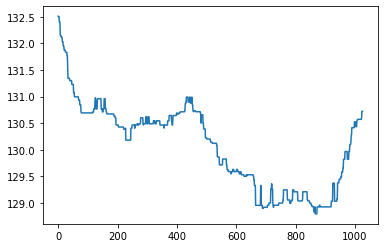

In [99]:
def get_percentile(array):
    print(array)
    p=np.percentile(array,10,axis=1)
    print(p.shape)
    return p
    
perc=get_percentile(array)
print(perc)
plt.plot(perc)

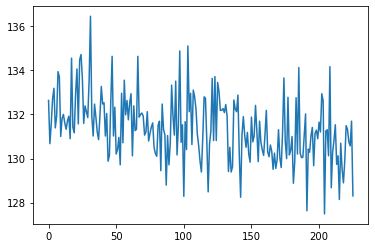

In [89]:
plt.plot(double_fish_before['profile_all'][0,500:-500])

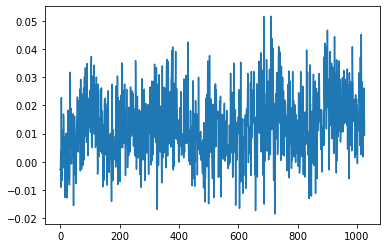

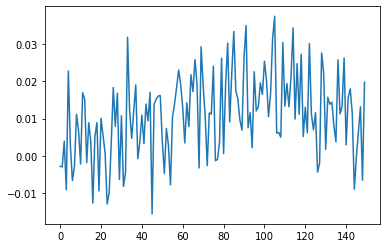

In [108]:
def get_dff(perc,time_s):
    dff=(time_s-perc)/(perc)
    return dff

dff=get_dff(perc,double_fish_before['profile_all'][0,:][100:-100])

plt.plot(dff)
plt.show()
plt.plot(dff[0:150])

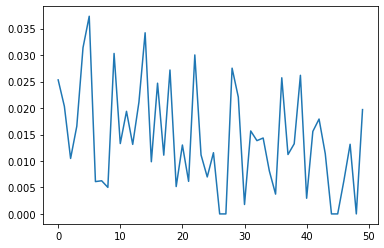

In [106]:
dff_=dff.copy()
dff_[dff_<0]=0
plt.plot(dff_[100:150])

In [ ]:
def extract_windows_vectorized(array, max_time, sub_window_size):
    start = 0 
    sub_windows = (
        start +
        # expand_dims are used to convert a 1D array to 2D array.
        np.expand_dims(np.arange(sub_window_size), 0) +
        np.expand_dims(np.arange(max_time + 1), 0).T
    )
    array=np.pad(array,(sub_window_size,sub_window_size),'constant',constant_values=(0,0))
    array=array[sub_windows]
    array=array[sub_window_size:-sub_window_size]
    return array

def get_percentile(array):
    p=np.percentile(array,10,axis=1)
    return p

array=extract_windows_vectorized(double_fish_before['profile_all'][0,:],1225,100)